# Exploration of Principal Component Analysis (PCA)

The Principal Component Analysis is a popular unsupervised learning technique for reducing the dimensionality of data. It increases interpretability yet, at the same time, it minimizes information loss. It helps to find the most significant features in a dataset and makes the data easy for plotting in 2D and 3D

As the number of features or dimensions in a dataset increases, the amount of data required to obtain a statistically significant result increases exponentially. This can lead to issues such as overfitting, increased computation time, and reduced accuracy of machine learning models this is known as the curse of dimensionality problems that arise while working with high-dimensional data.

The main goal of Principal Component Analysis (PCA) is to reduce the dimensionality of a dataset while preserving the most important patterns or relationships between the variables without any prior knowledge of the target variables. 

In [1]:
#importing important libary

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings as wr
wr.filterwarnings('ignore')

In [2]:
df = pd.read_csv('credit card.csv') #dataaset

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
df.shape

(30000, 25)

In [5]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [8]:
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [9]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [10]:
y.head(10)

0    1
1    1
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
Name: payment, dtype: int64

# Feature Scaling 

In [11]:
from sklearn.preprocessing import MinMaxScaler

In [12]:
mmx = MinMaxScaler()

In [13]:
scaled_x = mmx.fit_transform(x)

In [14]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

# Principal component Analysis

In [15]:
from sklearn.decomposition import PCA

In [16]:
pca = PCA(n_components=3)

In [17]:
x_pca = pca.fit_transform(scaled_x)

In [18]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259672],
       [-0.39188881,  0.209224  , -0.19698759],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728837, -0.08489179],
       [ 0.60374479, -0.01953155,  0.21421102],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [19]:
features = pd.DataFrame(x_pca,columns = ['pca1','pca2','pca3'])

In [20]:
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [21]:
#plotting in 3D
import plotly.express as pl
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')

# Splitting The Dataset

In [22]:
from sklearn.model_selection import train_test_split as tts

In [23]:
xtrain,xtest, ytrain,ytest = tts(features,y,test_size=.30,  random_state=1)

In [24]:
xtrain

,pca1,pca2,pca3
4936,0.588201,-0.220413,-0.321038
4788,0.616076,0.062374,0.319937
8447,-0.396698,0.103833,-0.210450
4535,0.588418,-0.368499,-0.139352
27563,0.619138,0.027233,0.115131
...,...,...,...
17289,-0.387321,0.169520,0.248251
5192,-0.413089,-0.415968,0.140726
12172,0.599752,0.071849,-0.267975
235,0.595272,-0.211586,-0.193925


# Model Creation

In [25]:
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()

In [26]:
clf.fit(xtrain,ytrain)

LogisticRegression()

In [27]:
atest = clf.score(xtest, ytest) * 100 #testing 

In [28]:
atrain = clf.score(xtrain, ytrain)*100  #training

# Bofore Applying PCA

In [29]:
xtrain1,xtest2, ytrain1,ytest1=tts(x,y,test_size=.30, random_state=1)

In [30]:
xtrain1.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
4936,20000.0,1,1,2,24,-1,-1,-1,-1,-1,...,390.0,780.0,0.0,0.0,390.0,390.0,780.0,0.0,0.0,0.0
4788,120000.0,1,2,1,52,2,0,0,0,0,...,105262.0,46605.0,45590.0,46204.0,4449.0,2731.0,3000.0,5000.0,3000.0,3000.0
8447,70000.0,2,2,2,26,0,0,0,0,0,...,26103.0,28342.0,24894.0,25272.0,3003.0,5106.0,4026.0,755.0,1029.0,5303.0
4535,230000.0,1,2,2,37,1,-2,-2,-2,-2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27563,130000.0,1,2,2,56,0,0,0,0,0,...,111780.0,116357.0,96936.0,98173.0,4000.0,5000.0,8000.0,4000.0,4000.0,5000.0


In [31]:
clf.fit(xtrain1,ytrain1)

LogisticRegression()

In [32]:
btest = clf.score(xtest2, ytest1) *100 #testing score

In [33]:
btrain = clf.score(xtrain1,ytrain1)*100 #training score

<Figure size 3000x3000 with 0 Axes>

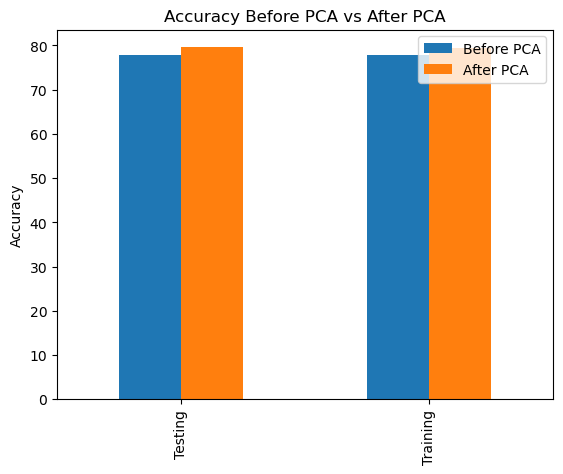

<Figure size 3000x3000 with 0 Axes>

In [34]:
plotdata = pd.DataFrame({ 
    "Before PCA":[btest, btrain],
    "After PCA":[atest, atrain],
    }, 
    index=["Testing", "Training"]
)
plotdata.plot(kind="bar")
plt.title("Accuracy Before PCA vs After PCA")
plt.ylabel("Accuracy")
plt.legend()  
plt.figure(figsize=(30,30))

Thanks For watching